In [1]:
using GraphMakie
using CSV
using DataFrames
using DelimitedFiles
using ColorSchemes
using Plots
using PlotThemes
using SankeyPlots
using Tables
using StatsPlots
using StatsBase
using LinearAlgebra
using DataFrames

theme(:ggplot2, palette=:Pastel2_8)

In [2]:
unwrapped_complex_names = vec(readdlm("data/complex_names.txt", '\t', String, '\n'))
unwrapped_monomer_names = vec(readdlm("data/protein_names.txt", '\t', String, '\n'))
unwrapped_cofactor_names = vec(readdlm("data/cofactor_names.txt", '\t', String, '\n'))
unwrapped_element_names = vec(readdlm("data/element_ids.txt", '\t', String, '\n'))
unwrapped_pathway_names = vec(readdlm("data/pathway_names.txt", '\t', String, '\n'))
unwrapped_complex_names = vec(readdlm("data/complex_names.txt", '\t', String, '\n'))
unwrapped_monomer_names = vec(readdlm("data/protein_names.txt", '\t', String, '\n'))
unwrapped_cofactor_names = vec(readdlm("data/cofactor_names.txt", '\t', String, '\n'))
unwrapped_element_names = vec(readdlm("data/element_ids.txt", '\t', String, '\n'))
unwrapped_pathway_names = vec(readdlm("data/pathway_names.txt", '\t', String, '\n'))

complex_ids = vec(readdlm("data/complex_ids.txt", '\t', String, '\n'))
monomer_ids = vec(readdlm("data/protein_ids.txt", '\t', String, '\n'))
cofactor_ids = vec(readdlm("data/cofactor_ids.txt", '\t', String, '\n'))
element_ids = vec(readdlm("data/element_ids.txt", '\t', String, '\n'))
pathway_ids = vec(readdlm("data/pathway_ids.txt", '\t', String, '\n'))
aa_ids = vec(readdlm("data/amino_acid_ids.txt", '\t', String, '\n'))


unwrapped_protein_names = [unwrapped_complex_names; unwrapped_monomer_names]
protein_ids = [complex_ids; monomer_ids]

C = Matrix(DataFrame(CSV.File("data/C_matrix.csv", header=false)))
P = Matrix(DataFrame(CSV.File("data/P_matrix.csv", header=false)))
E = Matrix(DataFrame(CSV.File("data/E_matrix.csv", header=false)))
W = Matrix(DataFrame(CSV.File("data/W_matrix.csv", header=false)))
W2 = Matrix(DataFrame(CSV.File("data/W2_matrix.csv", header=false)))
W1 = Matrix(DataFrame(CSV.File("data/W1_matrix.csv", header=false)))

A = Matrix(DataFrame(CSV.File("data/A_matrix.csv", header=false)))

Tree = Matrix(DataFrame(CSV.File("data/tree_matrix.csv")))

total_counts_min = Matrix(DataFrame(CSV.File("data/counts.csv", header=false)))
total_counts = Matrix(DataFrame(CSV.File("data/rich_counts.csv", header=false)))
total_counts_anaero = Matrix(DataFrame(CSV.File("data/anaerobic_counts.csv", header=false)))
# total_counts = Matrix(DataFrame(CSV.File("data/counts.csv", header=false)))
total_counts_big = Matrix(DataFrame(CSV.File("data/rich_counts_big.csv", header=false)))
total_counts_big = total_counts_big[:, 2:size(total_counts_big)[2] - 1]

monomer_masses = vec(Matrix(DataFrame(CSV.File("data/monomer_masses.csv", header=false))))
monomer_areas = vec(Matrix(DataFrame(CSV.File("data/monomer_areas.csv", header=false))))
complex_areas = vec(Matrix(DataFrame(CSV.File("data/complex_areas.csv", header=false))))
protein_areas = [complex_areas; monomer_areas]
complex_ids = vec(readdlm("data/complex_ids.txt", '\t', String, '\n'))
monomer_ids = vec(readdlm("data/protein_ids.txt", '\t', String, '\n'))
cofactor_ids = vec(readdlm("data/cofactor_ids.txt", '\t', String, '\n'))
element_ids = vec(readdlm("data/element_ids.txt", '\t', String, '\n'))
pathway_ids = vec(readdlm("data/pathway_ids.txt", '\t', String, '\n'))
aa_ids = vec(readdlm("data/amino_acid_ids.txt", '\t', String, '\n'))


unwrapped_protein_names = [unwrapped_complex_names; unwrapped_monomer_names]
protein_ids = [complex_ids; monomer_ids]

C = Matrix(DataFrame(CSV.File("data/C_matrix.csv", header=false)))
P = Matrix(DataFrame(CSV.File("data/P_matrix.csv", header=false)))
E = Matrix(DataFrame(CSV.File("data/E_matrix.csv", header=false)))
W = Matrix(DataFrame(CSV.File("data/W_matrix.csv", header=false)))
W2 = Matrix(DataFrame(CSV.File("data/W2_matrix.csv", header=false)))
W1 = Matrix(DataFrame(CSV.File("data/W1_matrix.csv", header=false)))

A = Matrix(DataFrame(CSV.File("data/A_matrix.csv", header=false)))

Tree = Matrix(DataFrame(CSV.File("data/tree_matrix.csv")))

li_counts = Matrix(DataFrame(CSV.File("data/li_counts.csv", header=false)))
li_counts_min = Matrix(DataFrame(CSV.File("data/li_counts_min.csv", header=false)))

total_counts_min = Matrix(DataFrame(CSV.File("data/counts.csv", header=false)))
total_counts = Matrix(DataFrame(CSV.File("data/rich_counts.csv", header=false)))
total_counts_anaero = Matrix(DataFrame(CSV.File("data/anaerobic_counts.csv", header=false)))
# total_counts = Matrix(DataFrame(CSV.File("data/counts.csv", header=false)))
total_counts_big = Matrix(DataFrame(CSV.File("data/rich_counts_big.csv", header=false)))
total_counts_big = total_counts_big[:, 2:size(total_counts_big)[2] - 1]

monomer_masses = vec(Matrix(DataFrame(CSV.File("data/monomer_masses.csv", header=false))))
monomer_areas = vec(Matrix(DataFrame(CSV.File("data/monomer_areas.csv", header=false))))
complex_areas = vec(Matrix(DataFrame(CSV.File("data/complex_areas.csv", header=false))))
protein_areas = [complex_areas; monomer_areas]


tim_export = total_counts * C * P * E
CSV.write("data/element_sim.csv",  Tables.table(tim_export), writeheader=true, header=unwrapped_element_names)

# dismutase_idx = findfirst(isequal("SUPEROX-DISMUTFE-CPLX"), protein_ids)
# total_counts[:, dismutase_idx] .= 15000

# nadh_dehyd_idx = findfirst(isequal("NADH-DHI-CPLX"), protein_ids) 
# total_counts[:, nadh_dehyd_idx, :] .= 400

# succ_quinone_idx = findfirst(isequal("CPLX0-8160"), protein_ids) 
# total_counts[:, succ_quinone_idx, :] .= 1000

# temp_remove = ["EG11415-MONOMER", "EG12132-MONOMER", "CPLX0-7908", 
#     "EG12332-MONOMER", "CPLX0-7617", "EG11378-MONOMER", "CPLX0-7824",
#     "G7748-MONOMER", "CPLX0-7682"]

# for item in temp_remove
#     cur_idx = findfirst(isequal(item), protein_ids)
#     total_counts[:, cur_idx] .= 0
# end

dps_idx = findfirst(isequal("EG11415-MONOMER"), monomer_ids) 
P[dps_idx, :] .= 0

counts_min = vec(total_counts_min[1100, :])
counts = vec(total_counts[600, :])
counts_anaero = vec(total_counts_anaero[2500, :])

total_counts_forecast = deepcopy(total_counts_anaero)

narg_idx = findfirst(isequal("NITRATREDUCTA-CPLX"), protein_ids) #x1000
total_counts_forecast[:, narg_idx] .= 10000 

# form_idx = findfirst(isequal("FORMATEDEHYDROGN-CPLX"), protein_ids) # x300
# total_counts_forecast[:, form_idx] .= 1000

# hyc_idx = findfirst(isequal("FHLMULTI-CPLX"), protein_ids) #x50
# total_counts_forecast[:, hyc_idx] .= 1000

total_counts_forecast_sox = deepcopy(total_counts)
sox_idx = findfirst(isequal("SUPEROX-DISMUTMN-CPLX"), protein_ids) #x10
total_counts_forecast_sox[:, sox_idx] .*= 10

# 
counts_forecast = vec(total_counts_forecast[600, :])

# correction


5527-element Vector{Int64}:
  21
   9
 688
 725
 147
 330
 252
  34
 360
  49
  27
  50
  18
   ⋮
   4
   2
   0
   0
  61
  10
   2
   0
   5
 310
   0
  16

In [3]:
function wrap_text(text::String, char_limit::Int)
    # Split the text into words
    words = split(text)
    wrapped_text = ""
    line_length = 0

    for word in words
        if line_length + length(word) > char_limit
            wrapped_text *= "\n"
            line_length = 0
        elseif wrapped_text != ""
            wrapped_text *= " "
        end
        wrapped_text *= word
        line_length += length(word) + 1  # +1 for the space
    end

    return wrapped_text
end

# Example usage:
char_limit = 30  # Insert a newline after 10 characters

# Wrap each category label
complex_names = [wrap_text(item, char_limit) for item in unwrapped_complex_names]
monomer_names = [wrap_text(item, char_limit) for item in unwrapped_monomer_names]
cofactor_names = [wrap_text(item, char_limit) for item in unwrapped_cofactor_names]
element_names = [wrap_text(item, char_limit) for item in unwrapped_element_names]
pathway_names = [wrap_text(item, char_limit) for item in unwrapped_pathway_names]
protein_names = [wrap_text(item, char_limit) for item in unwrapped_protein_names]

5527-element Vector{String}:
 "1-phosphofructokinase"
 "2-oxoglutarate dehydrogenase\ncomplex"
 "3-isopropylmalate\ndehydrogenase"
 "3-isopropylmalate dehydratase"
 "3-methyl-2-oxobutanoate\nhydroxymethyltransferase"
 "3-oxoacyl-[acyl carrier\nprotein] synthase 2"
 "6-phosphofructokinase 1"
 "6-phosphofructokinase 2"
 "6-phosphogluconate\ndehydrogenase, decarboxylating"
 "7-&alpha;-hydroxysteroid\ndehydrogenase"
 "8-amino-7-oxononanoate\nsynthase"
 "ferric enterobactin ABC\ntransporter"
 "iron(III) hydroxamate ABC\ntransporter"
 ⋮
 "putative ABC transporter\nmembrane subunit YphD"
 "putative ABC transporter\nATP-binding protein YphE"
 "DnaA initiator-associating\nprotein DiaA"
 "intermembrane phospholipid\ntransport system, integral\nmembrane subunit MlaE"
 "intermembrane phospholipid\ntransport system, ATP binding\nsubunit MlaF"
 "putative transport protein\nYrbG"
 "galactofuranose ABC\ntransporter periplasmic\nbinding protein"
 "galactofuranose ABC\ntransporter putative ATP\nbinding 

In [4]:
findfirst(isequal("NADH-DHI-CPLX"), protein_ids)

955

In [5]:
cur_idx = findfirst(isequal("PYRUVATEDEH-CPLX"), protein_ids)
counts[cur_idx]

264

In [6]:
cur_idx = findfirst(isequal("EG10889-MONOMER"), protein_ids)
counts[cur_idx]

17498

In [7]:
cur_idx = findfirst(isequal("CPLX0-3962"), protein_ids)
counts[cur_idx]

63155

# Create Sankey diagram of where the iron flows in the cell.

In [8]:
cur_elements = ["FE"]
cap_entries = 15

# create counts matrices
C_P_counts = C .* repeat(counts , 1, length(monomer_names))
# C_E_counts = C_P_counts * P * E
C_O_counts = C_P_counts * P
C_E_counts = C_P_counts * P * E
cofactor_counts = vec(sum(C_O_counts, dims=1))
O_E_counts =  E .* repeat(cofactor_counts, 1, length(element_names))


# we have to normalize the array because C is not norm-preserving. 
C_norm = Array{Float64}(copy(C))

for i in 1:size(C)[2]
    C_norm[i, :] = C[i, :] / (sum(C[i, :]) + 0.00001)
end

C_P_norm_counts = C .* repeat(counts, 1, length(monomer_names))
C_W_norm_counts_cats = C_P_norm_counts * W * W2

# creating element indices of interest
element_idxs = [element in cur_elements for element in element_names]
element_idxs_nz = findall(vec(element_idxs))

# create cofactor indices of interest
cofactor_idxs = vec(E[:, element_idxs] .> 0)
cofactor_idxs_nz = findall(vec(cofactor_idxs))

## cplx sorted by counts of elements
capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))

capped_C_O = C_O_counts[capped_complex_idx, cofactor_idxs]
capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]
capped_O_E = O_E_counts[cofactor_idxs, element_idxs]


# corrective factor multiplies a cplx by its cofactor stoichiometry, needed for classes
corrective_factor = sum((C * P * E)[capped_complex_idx, element_idxs], dims=2)
cofactor_element_corrective_factor = vec(E[cofactor_idxs, element_idxs])
cplx_element_norm = vec(capped_C_O * vec(E[cofactor_idxs, element_idxs]))
cplx_class_norm = vec(sum(capped_C_W, dims=2))

# create "remaining cofactors"
total_cofactor_counts = vec(sum(C_O_counts[:, cofactor_idxs], dims=1))
in_use_cofactor_counts = vec(sum(capped_C_O, dims=1))
remaining_cofactor_counts = vec(total_cofactor_counts - in_use_cofactor_counts)

# create "no class cplx", just use C_O counts
unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
unclassified_cplx_counts = vec(capped_C_O * cofactor_element_corrective_factor)

# create sizes
n_cplx = length(capped_complex_idx)
n_classes = length(capped_classes)
n_cofactors = length(cofactor_idxs_nz)
n_elements = length(cur_elements)

# initialize arrays
src = Vector{Int64}()
dst = Vector{Int64}()
weights = Vector{Int64}()

element_name = element_names[element_idxs][1]
n_atoms = sum(capped_O_E)

# create labels
node_labels = ["$element_name $n_atoms atoms"; 
                cofactor_names[cofactor_idxs];
                protein_names[capped_complex_idx]; 
                pathway_names[capped_classes];
                ["$c, \n other proteins" for c ∈ cofactor_names[cofactor_idxs]];
                "Uncategorized"
]

# create colors
colors = zeros(Int64, length(node_labels))

cofactor_colors = collect(1:(n_cofactors))
other_color = 0

colors[1] = 1
colors[2:(n_cofactors+1)] = cofactor_colors

# create sorting
## sorts elements
ordering_cofactors = Vector{Pair{Int64, Int64}}()
# sort_cofactors = sortperm(vec(sum(capped_C_O, dims=1)) .* cofactor_element_corrective_factor, rev=true)
# for i in 1:(n_cofactors-1)
#     push!(ordering_cofactors, (n_elements + sort_cofactors[i])=> (n_elements + sort_cofactors[i+1]))
# end


# order of index assignments
# elements, cplx, classes, remaining elements, no class label

# chart progress: E -> O -> C -> W
# E -> O 
for i in 1:n_elements
    for j in 1:n_cofactors
        if capped_O_E[j, i] != 0
            
            push!(src, i)
            push!(dst, n_elements + j)
            push!(weights, capped_O_E[j, i])
            
            # colors[n_elements + j] = colors[i]
            
        end  
    end
end

# E -> O, reverse order because im a dumbass
for i in 1:n_cofactors
    for j in 1:n_cplx
        if capped_C_O[j, i] != 0
            
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cofactors + j)
            push!(weights, trunc(Int, capped_C_O[j, i] * cofactor_element_corrective_factor[i]))
            
            colors[n_elements + n_cofactors + j] = colors[n_elements + i]
            
        end  
    end
end

# # C -> W
for i in 1:n_cplx
    for j in 1:n_classes
        if capped_C_W[i, j] != 0
            
            # corrective factor multiplies by element multiplicity to maintain flow size
            
            push!(src, n_elements + n_cofactors + i)
            push!(dst, n_elements + n_cofactors  + n_cplx + j)
            push!(weights, trunc(Int64, trunc(Int, capped_C_W[i, j] * cplx_element_norm[i]/cplx_class_norm[i])))  # just corrects to sum of previous
            
            # colors[n_elements + n_cofactors + n_cplx + j] = colors[n_elements + n_cofactors + i]
            colors[n_elements + n_cofactors + n_cplx + j] = colors[1]
            
        end  
    end
    
#     if unclassified_cplx_idxs[i]
#         push!(src, n_elements + n_cofactors + i)
#         push!(dst, n_elements + n_cofactors + n_cplx + n_classes + n_elements + 1)
#         push!(weights, unclassified_cplx_counts[i])
        
#         colors[n_elements + n_cofactors + n_cplx + n_classes + n_elements + 1] = colors[n_elements + n_cofactors + i]
#     end
    
end

# O -> C remaining cnts
for i in 1:n_cofactors
    push!(src, n_elements + i)
    push!(dst, n_elements + n_cofactors + n_cplx + n_classes + i)
    push!(weights, trunc(Int, remaining_cofactor_counts[i] * cofactor_element_corrective_factor[i]))
    colors[n_elements + n_cofactors + n_cplx + n_classes + i] = colors[n_elements+i]
end 

# # C -> W remaining cplxes in 
for i in 1:n_cplx
    if unclassified_cplx_idxs[i]
        push!(src, n_elements + n_cofactors + i)
        push!(dst, n_elements + n_cofactors + n_cplx + n_classes + n_cofactors + 1)
        push!(weights, trunc(Int, unclassified_cplx_counts[i]))
        colors[n_elements + n_cofactors + n_cplx + n_classes + n_cofactors + 1] = colors[i]
    end
end 




In [9]:


sankey(src, dst, weights, 
        compact = true,
        node_labels = node_labels,
        node_colors = cgrad(:copper, maximum(colors)+3, categorical = true, rev=true)[2:(maximum(colors)+2)][colors],
        edge_color = :src,
        size=(1600, 1200),
        label_position = :right,
        label_size = 10,
        force_order = ordering_cofactors,
        title="Iron cofactor distribution in a single cell"
)


# savefig("figures/iron.svg")




LoadError: BoundsError: attempt to access 6-element Array{RGBA{Float64},1} with eltype RGBA{Float64} at index [[1, 1, 2, 3, 4, 5, 2, 5, 5, 4  …  1, 1, 1, 1, 1, 2, 3, 4, 5, 0]]

# with fine grained pathways

# Redoing the plotting prep 

In [10]:
cur_elements = ["ZN"]
cap_entries = 8

# create counts matrices
C_P_counts = C .* repeat(counts_min, 1, length(monomer_names))
C_E_counts = C_P_counts * P * E


# we have to normalize the array because C is not norm-preserving. 
C_W = C * W * W2
C_W_norm = Array{Float64}(copy(C_W))

for i in 1:size(C_W_norm)[1]
    C_W_norm[i, :] = C_W[i, :] / (sum(C_W[i, :]) + 0.00001)
end

C_W_norm_counts_cats = C_W_norm

# creating element indices of interest
element_idxs = [element in cur_elements for element in element_names]
element_idxs_nz = findall(vec(element_idxs))

## cplx sorted by counts of elements
capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))

capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]


# corrective factor multiplies a cplx by its cofactor stoichiometry
corrective_factor = sum((C * P * E)[capped_complex_idx, element_idxs], dims=2)

# create "remaining elements"
total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))
in_use_element_counts = vec(sum(capped_C_E, dims=1))
remaining_element_counts = vec(total_element_counts - in_use_element_counts)

# create "no class cplx", just use C_E counts
unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
unclassified_cplx_counts = vec(sum(capped_C_E, dims=2))

# create sizes
n_cplx = length(capped_complex_idx)
n_classes = length(capped_classes)
n_elements = length(cur_elements)

# initialize arrays
src = Vector{Int64}()
dst = Vector{Int64}()
weights = Vector{Int64}()

test_class_count = Vector{Int64}()

# create labels
node_labels = [element_names[element_idxs]; 
                protein_names[capped_complex_idx]; 
                pathway_names[capped_classes];
                ["Remaining $c proteins" for c ∈ element_names[element_idxs]];
               # "Uncategorized"
]

# create colors
colors = ones(Int64, length(node_labels))

element_colors = collect(1:(n_elements))
other_color = 0

colors[1:n_elements] = element_colors

# create sorting
## sorts elements
ordering_elements = Vector{Pair{Int64, Int64}}()
sort_elements = sortperm(vec(sum(capped_C_E, dims=1)), rev=true)
for i in 1:(n_elements-1)
    push!(ordering_elements, sort_elements[i]=>sort_elements[i+1])
end

# sort_cplxs = sortperm(vec(sum(capped_C_E, dims=2)), rev=true)
# for i in 1:(n_cplx-1)
#     push!(ordering_elements, n_elements+sort_cplxs[i]=>n_elements+sort_cplxs[i+1]) 
# end

# order of index assignments
# elements, cplx, classes, remaining elements, no class label

# chart progress: E -> C -> W
# E -> C, reverse order because im a dumbass
for i in 1:n_elements
    for j in 1:n_cplx
        if capped_C_E[j, i] != 0
            
            push!(src, i)
            push!(dst, n_elements + j)
            push!(weights, capped_C_E[j, i])
            
            colors[n_elements + j] = colors[i]
            
        end  
    end
end

# # C -> W
for i in 1:n_cplx
    for j in 1:n_classes
        if capped_C_W[i, j] != 0
            
            # corrective factor multiplies by element multiplicity to maintain flow size
            
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cplx + j)
            push!(weights, trunc(Int64, capped_C_W[i, j] * capped_C_E[i]))   
            
            colors[n_elements + n_cplx + j] = colors[n_elements + i]

            push!(test_class_count, trunc(Int64, capped_C_W[i, j] * capped_C_E[i]))
            
        end  
    end
    
    if unclassified_cplx_idxs[i]
        push!(src, n_elements + i)
        push!(dst, n_elements + n_cplx + n_classes + n_elements + 1)
        push!(weights, unclassified_cplx_counts[i])
        
        colors[n_elements + n_cplx + n_classes + n_elements + 1] = colors[n_elements + i]
    end
    
end

# E -> C remaining cnts
for i in 1:n_elements
    push!(src, i)
    push!(dst, n_elements + n_cplx + n_classes + i)
    push!(weights, remaining_element_counts[i])
    colors[n_elements + n_cplx + n_classes + i] = colors[i]
end 

# # C -> P remaining cnts in displayed classes
# for i in 1:n_elements



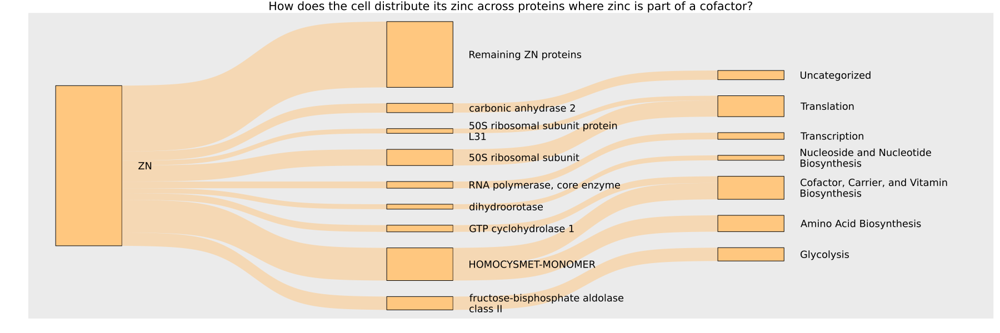

In [11]:
sankey(src, dst, weights, 
        compact = true,
        node_labels = node_labels,
        node_colors = cgrad(:copper, maximum(colors)+1, categorical = true, rev=true)[colors],
        edge_color = :src,
        size=(1800, 600),
        label_position = :right,
        label_size = 12,
        force_order = ordering_cofactors,
        title="How does the cell distribute its zinc across proteins where zinc is part of a cofactor?"
)

# savefig("figures/zinc.svg")

# Manganese

In [12]:
cur_elements = ["MN"]
cap_entries = 15

# create counts matrices
C_P_counts = C .* repeat(counts_min, 1, length(monomer_names))
C_E_counts = C_P_counts * P * E


# we have to normalize the array because C is not norm-preserving. 
C_W = C * W * W2
C_W_norm = Array{Float64}(copy(C_W))

for i in 1:size(C_W_norm)[1]
    C_W_norm[i, :] = C_W[i, :] / (sum(C_W[i, :]) + 0.00001)
end

C_W_norm_counts_cats = C_W_norm

# creating element indices of interest
element_idxs = [element in cur_elements for element in element_names]
element_idxs_nz = findall(vec(element_idxs))

## cplx sorted by counts of elements
capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))

capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]


# corrective factor multiplies a cplx by its cofactor stoichiometry
corrective_factor = sum((C * P * E)[capped_complex_idx, element_idxs], dims=2)

# create "remaining elements"
total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))
in_use_element_counts = vec(sum(capped_C_E, dims=1))
remaining_element_counts = vec(total_element_counts - in_use_element_counts)

# create "no class cplx", just use C_E counts
unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
unclassified_cplx_counts = vec(sum(capped_C_E, dims=2))

# create sizes
n_cplx = length(capped_complex_idx)
n_classes = length(capped_classes)
n_elements = length(cur_elements)

# initialize arrays
src = Vector{Int64}()
dst = Vector{Int64}()
weights = Vector{Int64}()

# create labels
node_labels = [element_names[element_idxs]; 
                protein_names[capped_complex_idx]; 
                pathway_names[capped_classes];
                ["Remaining $c proteins" for c ∈ element_names[element_idxs]]]

# create colors
colors = zeros(Int64, length(node_labels))

element_colors = collect(1:(n_elements))
other_color = 0

colors[1:n_elements] = element_colors

# create sorting
## sorts elements
ordering_elements = Vector{Pair{Int64, Int64}}()
sort_elements = sortperm(vec(sum(capped_C_E, dims=1)), rev=true)
for i in 1:(n_elements-1)
    push!(ordering_elements, sort_elements[i]=>sort_elements[i+1])
end

# sort_cplxs = sortperm(vec(sum(capped_C_E, dims=2)), rev=true)
# for i in 1:(n_cplx-1)
#     push!(ordering_elements, n_elements+sort_cplxs[i]=>n_elements+sort_cplxs[i+1]) 
# end

# order of index assignments
# elements, cplx, classes, remaining elements, no class label

# chart progress: E -> C -> W
# E -> C, reverse order because im a dumbass
for i in 1:n_elements
    for j in 1:n_cplx
        if capped_C_E[j, i] != 0
            
            push!(src, i)
            push!(dst, n_elements + j)
            push!(weights, capped_C_E[j, i])
            
            colors[n_elements + j] = colors[i]
            
        end  
    end
end

# # C -> W
for i in 1:n_cplx
    for j in 1:n_classes
        if capped_C_W[i, j] != 0
            
            # corrective factor multiplies by element multiplicity to maintain flow size
            
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cplx + j)
            push!(weights, trunc(Int64, capped_C_W[i, j] * capped_C_E[i]))   
            
            colors[n_elements + n_cplx + j] = colors[n_elements + i]
            
        end  
    end
    
    if unclassified_cplx_idxs[i]
        push!(src, n_elements + i)
        push!(dst, n_elements + n_cplx + n_classes + n_elements + 1)
        push!(weights, unclassified_cplx_counts[i])
        
        colors[n_elements + n_cplx + n_classes + n_elements + 1] = colors[n_elements + i]
    end
    
end

# E -> C remaining cnts
for i in 1:n_elements
    push!(src, i)
    push!(dst, n_elements + n_cplx + n_classes + i)
    push!(weights, remaining_element_counts[i])
    colors[n_elements + n_cplx + n_classes + i] = colors[i]
end 

# # C -> P remaining cnts in displayed classes
# for i in 1:n_elements



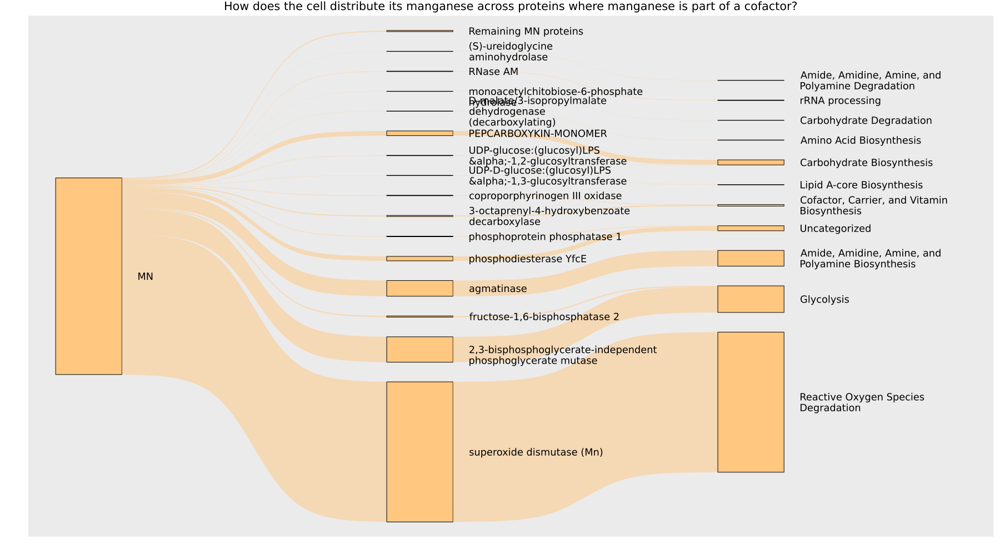

In [13]:
sankey(src, dst, weights, 
        compact = true,
        node_labels = node_labels,
        node_colors = cgrad(:copper, maximum(colors)+1, categorical = true, rev=true)[colors],
        edge_color = :src,
        size=(1800, 1000),
        label_position = :right,
        label_size = 12,
        force_order = ordering_cofactors,
        title="How does the cell distribute its manganese across proteins where manganese is part of a cofactor?"
)

# savefig("figures/manganese.svg")

In [14]:
cur_elements = ["MO"]
cap_entries = 10

# create counts matrices
C_P_counts = C .* repeat(counts_forecast, 1, length(monomer_names))
C_E_counts = C_P_counts * P * E


# we have to normalize the array because C is not norm-preserving. 
C_W = C * W * W2
C_W_norm = Array{Float64}(copy(C_W))

for i in 1:size(C_W_norm)[1]
    C_W_norm[i, :] = C_W[i, :] / (sum(C_W[i, :]) + 0.00001)
end

C_W_norm_counts_cats = C_W_norm

# creating element indices of interest
element_idxs = [element in cur_elements for element in element_names]
element_idxs_nz = findall(vec(element_idxs))

## cplx sorted by counts of elements
capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))

capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]


# corrective factor multiplies a cplx by its cofactor stoichiometry
corrective_factor = sum((C * P * E)[capped_complex_idx, element_idxs], dims=2)

# create "remaining elements"
total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))
in_use_element_counts = vec(sum(capped_C_E, dims=1))
remaining_element_counts = vec(total_element_counts - in_use_element_counts)

# create "no class cplx", just use C_E counts
unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
unclassified_cplx_counts = vec(sum(capped_C_E, dims=2))

# create sizes
n_cplx = length(capped_complex_idx)
n_classes = length(capped_classes)
n_elements = length(cur_elements)

# initialize arrays
src = Vector{Int64}()
dst = Vector{Int64}()
weights = Vector{Int64}()

# create labels
node_labels = [element_names[element_idxs]; 
                protein_names[capped_complex_idx]; 
                pathway_names[capped_classes];
                ["Remaining $c proteins" for c ∈ element_names[element_idxs]];]

# create colors
colors = zeros(Int64, length(node_labels))

element_colors = collect(1:(n_elements))
other_color = 0

colors[1:n_elements] = element_colors

# create sorting
## sorts elements
ordering_elements = Vector{Pair{Int64, Int64}}()
sort_elements = sortperm(vec(sum(capped_C_E, dims=1)), rev=true)
for i in 1:(n_elements-1)
    push!(ordering_elements, sort_elements[i]=>sort_elements[i+1])
end

# sort_cplxs = sortperm(vec(sum(capped_C_E, dims=2)), rev=true)
# for i in 1:(n_cplx-1)
#     push!(ordering_elements, n_elements+sort_cplxs[i]=>n_elements+sort_cplxs[i+1]) 
# end

# order of index assignments
# elements, cplx, classes, remaining elements, no class label

# chart progress: E -> C -> W
# E -> C, reverse order because im a dumbass
for i in 1:n_elements
    for j in 1:n_cplx
        if capped_C_E[j, i] != 0
            
            push!(src, i)
            push!(dst, n_elements + j)
            push!(weights, capped_C_E[j, i])
            
            colors[n_elements + j] = colors[i]
            
        end  
    end
end

# # C -> W
for i in 1:n_cplx
    for j in 1:n_classes
        if capped_C_W[i, j] != 0
            
            # corrective factor multiplies by element multiplicity to maintain flow size
            
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cplx + j)
            push!(weights, trunc(Int64, capped_C_W[i, j] * capped_C_E[i]))   
            
            colors[n_elements + n_cplx + j] = colors[n_elements + i]
            
        end  
    end
    
    if unclassified_cplx_idxs[i]
        push!(src, n_elements + i)
        push!(dst, n_elements + n_cplx + n_classes + n_elements + 1)
        push!(weights, unclassified_cplx_counts[i])
        
        colors[n_elements + n_cplx + n_classes + n_elements + 1] = colors[n_elements + i]
    end
    
end

# E -> C remaining cnts
for i in 1:n_elements
    push!(src, i)
    push!(dst, n_elements + n_cplx + n_classes + i)
    push!(weights, remaining_element_counts[i])
    colors[n_elements + n_cplx + n_classes + i] = colors[i]
end 

# # C -> P remaining cnts in displayed classes
# for i in 1:n_elements



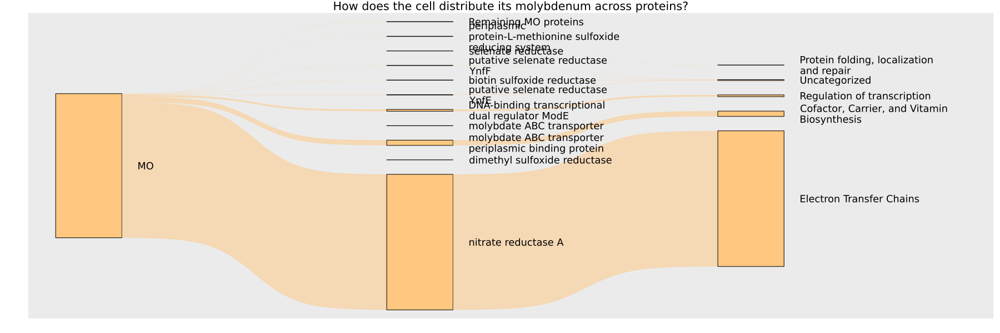

In [15]:
sankey(src, dst, weights, 
        compact = true,
        node_labels = node_labels,
        node_colors = cgrad(:copper, maximum(colors)+1, categorical = true, rev=true)[colors],
        edge_color = :src,
        size=(1800, 600),
        label_position = :right,
        label_size = 12,
        force_order = ordering_cofactors,
        title="How does the cell distribute its molybdenum across proteins?"
)

# savefig("figures/manganese.svg")

# Others

In [16]:
cur_elements = ["NI", "CU", "MO",]
cap_entries = 15

# create counts matrices
C_P_counts = C .* repeat(counts, 1, length(monomer_names))
C_E_counts = C_P_counts * P * E


# we have to normalize the array because C is not norm-preserving. 
C_W = C * W * W2
C_W_norm = Array{Float64}(copy(C_W))

for i in 1:size(C_W_norm)[1]
    C_W_norm[i, :] = C_W[i, :] / (sum(C_W[i, :]) + 0.00001)
end

C_W_norm_counts_cats = C_W_norm

# creating element indices of interest
element_idxs = [element in cur_elements for element in element_names]
element_idxs_nz = findall(vec(element_idxs))

## cplx sorted by counts of elements
capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))

capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]


# corrective factor multiplies a cplx by its cofactor stoichiometry
corrective_factor = sum((C * P * E)[capped_complex_idx, element_idxs], dims=2)

# create "remaining elements"
total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))
in_use_element_counts = vec(sum(capped_C_E, dims=1))
remaining_element_counts = vec(total_element_counts - in_use_element_counts)

# create "no class cplx", just use C_E counts
unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
unclassified_cplx_counts = vec(sum(capped_C_E, dims=2))

# create sizes
n_cplx = length(capped_complex_idx)
n_classes = length(capped_classes)
n_elements = length(cur_elements)

# initialize arrays
src = Vector{Int64}()
dst = Vector{Int64}()
weights = Vector{Int64}()

# create labels
node_labels = [element_names[element_idxs]; 
                protein_names[capped_complex_idx]; 
                pathway_names[capped_classes];
                ["Remaining $c proteins" for c ∈ element_names[element_idxs]];
                # "Uncategorized"
]

# create colors
colors = zeros(Int64, length(node_labels))

element_colors = collect(1:(n_elements))
other_color = 0

colors[1:n_elements] = element_colors

# create sorting
## sorts elements
ordering_elements = Vector{Pair{Int64, Int64}}()
sort_elements = sortperm(vec(sum(capped_C_E, dims=1)), rev=true)
for i in 1:(n_elements-1)
    push!(ordering_elements, sort_elements[i]=>sort_elements[i+1])
end

# sort_cplxs = sortperm(vec(sum(capped_C_E, dims=2)), rev=true)
# for i in 1:(n_cplx-1)
#     push!(ordering_elements, n_elements+sort_cplxs[i]=>n_elements+sort_cplxs[i+1]) 
# end

# order of index assignments
# elements, cplx, classes, remaining elements, no class label

# chart progress: E -> C -> W
# E -> C, reverse order because im a dumbass
for i in 1:n_elements
    for j in 1:n_cplx
        if capped_C_E[j, i] != 0
            
            push!(src, i)
            push!(dst, n_elements + j)
            push!(weights, capped_C_E[j, i])
            
            colors[n_elements + j] = colors[i]
            
        end  
    end
end

# # C -> W
for i in 1:n_cplx
    for j in 1:n_classes
        if capped_C_W[i, j] != 0
            
            # corrective factor multiplies by element multiplicity to maintain flow size
            
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cplx + j)
            push!(weights, trunc(Int64, capped_C_W[i, j] * vec(sum(capped_C_E, dims=2))[i]))   
            
            colors[n_elements + n_cplx + j] = colors[n_elements + i]
            
        end  
    end
    
    if unclassified_cplx_idxs[i]
        push!(src, n_elements + i)
        push!(dst, n_elements + n_cplx + n_classes + n_elements + 1)
        push!(weights, unclassified_cplx_counts[i])
        
        colors[n_elements + n_cplx + n_classes + n_elements + 1] = colors[n_elements + i]
    end
    
end

# # E -> C remaining cnts
# for i in 1:n_elements
#     push!(src, i)
#     push!(dst, n_elements + n_cplx + n_classes + i)
#     push!(weights, remaining_element_counts[i])
#     colors[n_elements + n_cplx + n_classes + i] = colors[i]
# end 

# # C -> P remaining cnts in displayed classes
# for i in 1:n_elements



In [17]:
src

30-element Vector{Int64}:
  1
  1
  1
  1
  1
  1
  2
  2
  2
  2
  2
  3
  3
  ⋮
  7
  8
  9
 10
 11
 12
 13
 14
 15
 16
 17
 18

In [18]:
sankey(src, dst, weights, 
        compact = true,
        node_labels = node_labels,
        node_colors = cgrad(:copper, maximum(colors)+1, categorical = true, rev=true)[colors],
        edge_color = :src,
        size=(1800, 1000),
        label_position = :right,
        label_size = 12,
        force_order = ordering_cofactors,
        title="Rarely used, yet important  metals: copper, molybdenum, nickel, cobalt and selenium"
)

# savefig("figures/other_metals.svg")

LoadError: BoundsError: attempt to access 4-element Array{RGBA{Float64},1} with eltype RGBA{Float64} at index [[1, 2, 3, 2, 2, 2, 1, 1, 3, 2  …  2, 1, 2, 3, 1, 2, 1, 0, 0, 0]]

# Create data set for Tim

In [19]:
all_elements = ["FE", "ZN", "MN", "CU", "NI", "MO", "SE", "CO"]

df = DataFrame(name=["test"], element_id=["N/A"], ecocyc_id=["N/A"], plot_id=[-1], count=[-1], parent=[-1])

for q in 1:length(all_elements)
    cur_elements = [all_elements[q]]
    cap_entries = 100
    
    # create counts matrices
    C_P_counts = C .* repeat(counts_min, 1, length(monomer_names))
    C_E_counts = C_P_counts * P * E
    
    
    # we have to normalize the array because C is not norm-preserving. 
    C_W = C * W * W2
    C_W_norm = Array{Float64}(copy(C_W))
    
    for i in 1:size(C_W_norm)[1]
        C_W_norm[i, :] = C_W[i, :] / (sum(C_W[i, :]) + 0.00001)
    end
    
    C_W_norm_counts_cats = C_W_norm
    
    # creating element indices of interest
    element_idxs = [element in cur_elements for element in element_names]
    element_idxs_nz = findall(vec(element_idxs))
    
    ## cplx sorted by counts of elements
    capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
    
    
    capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))
    
    capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
    capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]
    
    
    # corrective factor multiplies a cplx by its cofactor stoichiometry
    corrective_factor = sum((C * P * E)[capped_complex_idx, element_idxs], dims=2)
    
    # create "remaining elements"
    total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))
    in_use_element_counts = vec(sum(capped_C_E, dims=1))
    remaining_element_counts = vec(total_element_counts - in_use_element_counts)
    
    # create "no class cplx", just use C_E counts
    unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
    unclassified_cplx_counts = vec(sum(capped_C_E, dims=2))
    
    # create sizes
    n_cplx = length(capped_complex_idx)
    n_classes = length(capped_classes)
    n_elements = length(cur_elements)
    
    # initialize arrays
    src = Vector{Int64}()
    dst = Vector{Int64}()
    weights = Vector{Int64}()
    
    # create labels
    node_labels = [element_names[element_idxs]; 
                    protein_names[capped_complex_idx]; 
                    pathway_names[capped_classes];
                    ["Remaining $c proteins" for c ∈ element_names[element_idxs]];
                    "Uncategorized"]

    # create labels
    node_ids = [element_ids[element_idxs]; 
                    protein_ids[capped_complex_idx]; 
                    pathway_ids[capped_classes];
                    ["Remaining $c proteins" for c ∈ element_ids[element_idxs]];
                    "Uncategorized"]
    
    # create colors
    colors = zeros(Int64, length(node_labels))
    
    element_colors = collect(1:(n_elements))
    other_color = 0
    
    colors[1:n_elements] = element_colors
    
    # create sorting
    ## sorts elements
    ordering_elements = Vector{Pair{Int64, Int64}}()
    sort_elements = sortperm(vec(sum(capped_C_E, dims=1)), rev=true)
    for i in 1:(n_elements-1)
        push!(ordering_elements, sort_elements[i]=>sort_elements[i+1])
    end
    
    # sort_cplxs = sortperm(vec(sum(capped_C_E, dims=2)), rev=true)
    # for i in 1:(n_cplx-1)
    #     push!(ordering_elements, n_elements+sort_cplxs[i]=>n_elements+sort_cplxs[i+1]) 
    # end
    
    # order of index assignments
    # elements, cplx, classes, remaining elements, no class label
    
    # chart progress: E -> C -> W
    # E -> C, reverse order because im a dumbass
    for i in 1:n_elements
        for j in 1:n_cplx
            if capped_C_E[j, i] != 0
                
                push!(src, i)
                push!(dst, n_elements + j)
                push!(weights, capped_C_E[j, i])
                
                colors[n_elements + j] = colors[i]
                
            end  
        end
    end
    
    # # C -> W
    for i in 1:n_cplx
        for j in 1:n_classes
            if capped_C_W[i, j] != 0
                
                # corrective factor multiplies by element multiplicity to maintain flow size
                
                push!(src, n_elements + i)
                push!(dst, n_elements + n_cplx + j)
                push!(weights, trunc(Int64, capped_C_W[i, j] * vec(sum(capped_C_E, dims=2))[i]))   
                
                colors[n_elements + n_cplx + j] = colors[n_elements + i]
                
            end  
        end
        
        if unclassified_cplx_idxs[i]
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cplx + n_classes + n_elements + 1)
            push!(weights, unclassified_cplx_counts[i])
            
            colors[n_elements + n_cplx + n_classes + n_elements + 1] = colors[n_elements + i]
        end
        
    end
    
    # E -> C remaining cnts
    for i in 1:n_elements
        push!(src, i)
        push!(dst, n_elements + n_cplx + n_classes + i)
        push!(weights, remaining_element_counts[i])
        colors[n_elements + n_cplx + n_classes + i] = colors[i]
    end 
    
    # # C -> P remaining cnts in displayed classes
    # for i in 1:n_elements



    class_idx = Vector{Int64}()
    class_totals = Vector{Int64}()
    class_parents = Vector{Int64}()
    class_names = Vector{String}()
    class_ids = Vector{String}()
    
    cplx_idx = Vector{Int64}()
    cplx_parents = Vector{Int64}()
    cplx_counts = Vector{Int64}()
    cplx_names = Vector{String}()
    cplx_ids = Vector{String}()
    
    for flow in 1:length(src)
    
        cur_src = src[flow]
        cur_dst = dst[flow]
        cur_weight = weights[flow]
        src_label = node_labels[cur_src]
        dst_label = node_labels[cur_dst]
        src_id = node_ids[cur_src]
        dst_id = node_ids[cur_dst]
        
    
        # print(cur_src," ", cur_dst," ", cur_weight, "\n")
    
        if cur_dst > n_elements + n_cplx && cur_dst < n_elements + n_cplx + n_classes + 1 
            
            if cur_dst in class_idx
                cur_idx = class_idx .== cur_dst
                class_totals[cur_idx] .+= cur_weight
            else
                push!(class_idx, cur_dst)
                push!(class_totals, cur_weight)
                push!(class_names, dst_label)
                push!(class_ids, dst_id)
                push!(class_parents, 1)
            end
    
            push!(cplx_idx, cur_src)
            push!(cplx_parents, cur_dst)
            push!(cplx_counts, cur_weight)
            push!(cplx_names, src_label)
            push!(cplx_ids, src_id)
    
        end
    
    end

    # to differ metals, add 10000 times q. 
    class_idx .+= (q*10000)
    class_parents .+= (q*10000)
    cplx_idx .+= (q*10000)
    cplx_parents .+= (q*10000)

    df_element = DataFrame(name=cur_elements[1], element_id=cur_elements[1], ecocyc_id="N/A", 
        plot_id = (q*10000)+1, count=sum(total_element_counts), parent=-1)
    df_inner = DataFrame(name=class_names, element_id=cur_elements[1], ecocyc_id=class_ids, plot_id=class_idx, count=class_totals, parent=class_parents)
    df_outer = DataFrame(name=cplx_names, element_id=cur_elements[1], ecocyc_id=cplx_ids, plot_id=cplx_idx, count=cplx_counts, parent=cplx_parents)

    df = vcat(df, df_element, df_inner, df_outer)

end


In [20]:
CSV.write("tim_cofactors_minimal.csv", df)

"tim_cofactors_minimal.csv"

# organic cofactors

In [21]:
cur_elements = ["FAD", "FMN", "thiamine diphosphate", "pyridoxal 5'-phosphate", "biotin", "(<i>R</i>)-lipoate"]
cap_entries = 20

# create counts matrices
C_P_counts = C .* repeat(counts, 1, length(monomer_names))
C_E_counts = C_P_counts * P #  * E


# we have to normalize the array because C is not norm-preserving. 
C_W = C * W * W2
C_W_norm = Array{Float64}(copy(C_W))

for i in 1:size(C_W_norm)[1]
    C_W_norm[i, :] = C_W[i, :] / (sum(C_W[i, :]) + 0.00001)
end

C_W_norm_counts_cats = C_W_norm

# creating element indices of interest
element_idxs = [element in cur_elements for element in cofactor_names]
element_idxs_nz = findall(vec(element_idxs))

## cplx sorted by counts of elements
capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))

capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]


# corrective factor multiplies a cplx by its cofactor stoichiometry
corrective_factor = sum((C * P)[capped_complex_idx, element_idxs], dims=2)

# create "remaining elements"
total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))
in_use_element_counts = vec(sum(capped_C_E, dims=1))
remaining_element_counts = vec(total_element_counts - in_use_element_counts)

# create "no class cplx", just use C_E counts
unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
unclassified_cplx_counts = vec(sum(capped_C_E, dims=2))

# create sizes
n_cplx = length(capped_complex_idx)
n_classes = length(capped_classes)
n_elements = length(cur_elements)

# initialize arrays
src = Vector{Int64}()
dst = Vector{Int64}()
weights = Vector{Int64}()

# create labels
node_labels = [cofactor_names[element_idxs]; 
                protein_names[capped_complex_idx]; 
                pathway_names[capped_classes];
                ["Remaining $c proteins" for c ∈ cofactor_names[element_idxs]];
                "Uncategorized"]

# create colors
colors = zeros(Int64, length(node_labels))

element_colors = collect(1:(n_elements))
other_color = 0

colors[1:n_elements] = element_colors

# create sorting
## sorts elements
ordering_elements = Vector{Pair{Int64, Int64}}()
sort_elements = sortperm(vec(sum(capped_C_E, dims=1)), rev=true)
for i in 1:(n_elements-1)
    push!(ordering_elements, sort_elements[i]=>sort_elements[i+1])
end

# sort_cplxs = sortperm(vec(sum(capped_C_E, dims=2)), rev=true)
# for i in 1:(n_cplx-1)
#     push!(ordering_elements, n_elements+sort_cplxs[i]=>n_elements+sort_cplxs[i+1]) 
# end

# order of index assignments
# elements, cplx, classes, remaining elements, no class label

# chart progress: E -> C -> W
# E -> C, reverse order because im a dumbass
for i in 1:n_elements
    for j in 1:n_cplx
        if capped_C_E[j, i] != 0
            
            push!(src, i)
            push!(dst, n_elements + j)
            push!(weights, capped_C_E[j, i])
            
            colors[n_elements + j] = colors[i]
            
        end  
    end
end

# # C -> W
for i in 1:n_cplx
    for j in 1:n_classes
        if capped_C_W[i, j] != 0
            
            # corrective factor multiplies by element multiplicity to maintain flow size
            
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cplx + j)
            push!(weights, trunc(Int64, capped_C_W[i, j] * vec(sum(capped_C_E, dims=2))[i]))   
            
            colors[n_elements + n_cplx + j] = colors[n_elements + i]
            
        end  
    end
    
    if unclassified_cplx_idxs[i]
        push!(src, n_elements + i)
        push!(dst, n_elements + n_cplx + n_classes + n_elements + 1)
        push!(weights, unclassified_cplx_counts[i])
        
        colors[n_elements + n_cplx + n_classes + n_elements + 1] = colors[n_elements + i]
    end
    
end

# E -> C remaining cnts
for i in 1:n_elements
    push!(src, i)
    push!(dst, n_elements + n_cplx + n_classes + i)
    push!(weights, remaining_element_counts[i])
    colors[n_elements + n_cplx + n_classes + i] = colors[i]
end 

# # C -> P remaining cnts in displayed classes
# for i in 1:n_elements



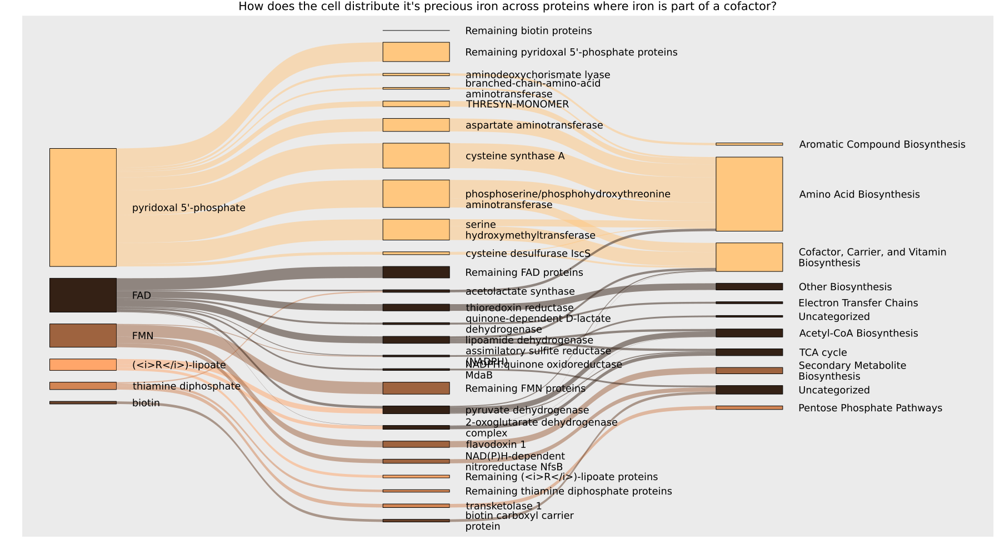

In [22]:
sankey(src, dst, weights, 
        compact = true,
        node_labels = node_labels,
        node_colors = cgrad(:copper, maximum(colors)+1, categorical = true, rev=true)[colors],
        edge_color = :src,
        size=(1800, 1000),
        label_position = :right,
        label_size = 12,
        force_order = ordering_elements,
        title="How does the cell distribute it's precious iron across proteins where iron is part of a cofactor?"
)

# savefig("figures/organic.svg")

# Histograms


# Specialist vs generalist, CDF 

In [23]:
top_utilizers_per_metal = Vector{Vector{Float64}}()

elements = ["FE", "ZN", "MN", "MO","CU", "SE", "NI", "CO"]

for element in elements
    cur_elements = [element]
    cap_entries = 250
    
    # create counts matrices
    C_P_counts = C .* repeat(counts, 1, length(monomer_names))
    C_E_counts = C_P_counts * P * E
    
    # creating element indices of interest
    element_idxs = [element in cur_elements for element in element_names]
    element_idxs_nz = findall(vec(element_idxs))
    
    ## cplx sorted by counts of elements
    capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
    capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))
    
    capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
    capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]
    
    total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))


    push!(top_utilizers_per_metal, vec(capped_C_E ./ total_element_counts))
    
end


# to matrix
top_utilizers_per_metal = mapreduce(permutedims, vcat, top_utilizers_per_metal)




8×250 Matrix{Float64}:
 0.0829005  0.0447835  0.0446907  …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.158264   0.114675   0.0655838     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.668145   0.118116   0.0700461     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.534487   0.295241   0.0397048     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.562779   0.2047     0.204117      0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.807692   0.192308   0.0        …  0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.668326   0.0721842  0.0678283     0.0  0.0  0.0  0.0  0.0  0.0  0.0
 0.982026   0.0179739  0.0           0.0  0.0  0.0  0.0  0.0  0.0  0.0

In [24]:
cdf_df = DataFrame(transpose(cumsum(top_utilizers_per_metal, dims=2)), elements)
cdf_df[!, "Protein_n"] = 1:size(cdf_df)[1]
cdf_df

cdf_df = stack(cdf_df, variable_name="Metal", value_name="Cumulative_fraction")

Row,Protein_n,Metal,Cumulative_fraction
,Int64,String,Float64
1,1,FE,0.0829005
2,2,FE,0.127684
3,3,FE,0.172375
4,4,FE,0.213015
5,5,FE,0.252372
6,6,FE,0.288472
7,7,FE,0.322877
8,8,FE,0.351741
9,9,FE,0.378027


In [25]:
@df cdf_df plot(:Protein_n, :Cumulative_fraction, group=:Metal, width=5, xlabel="Protein n, sorted", ylabel="Cumulative fraction of metal capacity")

LoadError: SYSTEM: show(lasterr) caused an error

In [26]:
@df cdf_df plot(:Protein_n, :Cumulative_fraction, group=:Metal, width=5, xlabel="Protein n, sorted", ylabel="Cumulative fraction of metal capacity",
xlims=(1, 20))

LoadError: InterruptException:

# Avg. protein expression for different metals

In [27]:
C_P_counts = C .* repeat(counts, 1, length(monomer_names))
C_E_counts = C_P_counts * P * E

LoadError: InterruptException:

In [28]:
cur_elements = ["FE", "ZN", "MO", "NI", "SE"]
fraction_expressed = Vector{Float64}()

for element in cur_elements

    cplx_with_element = findall(C * P * vec(E[:, element_ids .== element]) .!= 0)

    push!(fraction_expressed, sum(counts[cplx_with_element] .>= 100) / length(counts[cplx_with_element]))

end

push!(cur_elements, "Random")
push!(fraction_expressed, sum(counts .>= 100) / length(counts))

LoadError: InterruptException:

In [29]:
fraction_order = sortperm(fraction_expressed)

bar(fraction_expressed[fraction_order], xticks=(1:length(cur_elements), cur_elements[fraction_order]), title="Fraction of proteins with count>100 in standard rich")

LoadError: InterruptException:

# Combined

In [30]:
cur_elements = ["FE", "ZN", "MN", "CU", "MO", "NI", "CO"]

val_data = [vec([180000 200000 5000 10000 1000 0 0]) vec([25000 25000 5000 10000 1000 1000 1000]) cur_elements ["Minimal" for i in 1:7];
vec([600000 400000 50000 70000 5000 0 0]) vec([100000 50000 10000 20000 1000 1000 1000]) cur_elements ["Rich" for i in 1:7]]

val_df = DataFrame(val_data, ["Counts", "Sd", "Element", "Media"])

LoadError: InterruptException:

In [31]:
element_timeseries = total_counts * C * P * E

cur_elements = ["FE", "ZN", "MN", "CU", "MO", "NI", "CO"]

element_idx = [findfirst(==(element), element_names) for element in cur_elements]

current_series = element_timeseries[:,element_idx]

averages = sum(current_series, dims=1) / size(current_series)[1]

series_df = DataFrame(current_series, cur_elements)
stack_series_df =stack(series_df, 1:length(cur_elements), variable_name="Element", value_name="Counts")
stack_series_df[!, "Media"] = ["Rich" for i in 1:size(stack_series_df)[1]]
stack_series_df[!, "Volume"] = [4 for i in 1:size(stack_series_df)[1]]



element_timeseries = total_counts_min * C * P * E

current_series = element_timeseries[:,element_idx]

series_df = DataFrame(current_series, cur_elements)
stack_series_df_2 =stack(series_df, 1:length(cur_elements), variable_name="Element", value_name="Counts")
stack_series_df_2[!, "Media"] = ["Minimal" for i in 1:size(stack_series_df_2)[1]]
stack_series_df_2[!, "Volume"] = [2 for i in 1:size(stack_series_df_2)[1]]


element_timeseries = total_counts_anaero * C * P * E

current_series = element_timeseries[:,element_idx]

series_df = DataFrame(current_series, cur_elements)
stack_series_df_3 =stack(series_df, 1:length(cur_elements), variable_name="Element", value_name="Counts")
stack_series_df_3[!, "Media"] = ["Anaerobic" for i in 1:size(stack_series_df_3)[1]]
stack_series_df_3[!, "Volume"] = [1 for i in 1:size(stack_series_df_3)[1]]



element_timeseries = total_counts_forecast * C * P * E

current_series = element_timeseries[:,element_idx]

series_df = DataFrame(current_series, cur_elements)
stack_series_df_4 =stack(series_df, 1:length(cur_elements), variable_name="Element", value_name="Counts")
stack_series_df_4[!, "Media"] = ["Anaerobic + NO3" for i in 1:size(stack_series_df_4)[1]]
stack_series_df_4[!, "Volume"] = [1 for i in 1:size(stack_series_df_4)[1]]

element_timeseries = total_counts_forecast_sox * C * P * E
current_series = element_timeseries[:,element_idx]

series_df = DataFrame(current_series, cur_elements)
stack_series_df_5 =stack(series_df, 1:length(cur_elements), variable_name="Element", value_name="Counts")
stack_series_df_5[!, "Media"] = ["Rich + sox" for i in 1:size(stack_series_df_5)[1]]
stack_series_df_5[!, "Volume"] = [4 for i in 1:size(stack_series_df_5)[1]]


total_df = vcat(stack_series_df, stack_series_df_2, stack_series_df_3, stack_series_df_4, stack_series_df_5)
total_df[!, "Concentration"] = total_df[!, "Counts"] ./ total_df[!, "Volume"]

LoadError: InterruptException:

In [32]:
@df total_df groupedboxplot(:Element, :Counts, group=:Media, 
    title="Simulation counts across conditions", xlabel="Element", ylabel="Counts per cell", 
    yaxis=:log, 
    ylims=[100,1000000]
)
# @df val_df dotplot!(:Element, :Counts, group=:Media,  markerstrokewidth = 2, label="Validation")
# @df stack_val_df scatter!(:metal, :count, yerror=[25000, 25000, 5000, 10000], markerstrokewidth = 2, label="Validation")
# , label="Simulation", title="Minimal media (low Mn)", xlabel="Element", ylabel="Counts per cell"

LoadError: SYSTEM: show(lasterr) caused an error

In [33]:
@df total_df groupedboxplot(:Element, :Concentration, group=:Media, 
    title="Simulation concentrations across conditions", xlabel="Element", ylabel="Concentration per cell", 
    yaxis=:log, 
    ylims=[100,1000000]
)
# @df val_df dotplot!(:Element, :Counts, group=:Media,  markerstrokewidth = 2, label="Validation")
# @df stack_val_df scatter!(:metal, :count, yerror=[25000, 25000, 5000, 10000], markerstrokewidth = 2, label="Validation")
# , label="Simulation", title="Minimal media (low Mn)", xlabel="Element", ylabel="Counts per cell"

LoadError: UndefVarError: `total_df` not defined

In [34]:
@df val_df scatter(:Element, :Counts, group=:Media, yerror=:Sd, markerstrokewidth = 2)

LoadError: UndefVarError: `val_df` not defined

# Methionine sketch

In [35]:
data = [2000 280000;
        400000 700000;
        180000 16000;
        2000 80000;
        2000 80000]

ctg = repeat(["+met", "-met"], inner = 5)
nam = repeat(["metE counts", "zinc atoms per cell", "rpmE counts", "ykgM counts", "ykgO counts"], outer = 2)

10-element Vector{String}:
 "metE counts"
 "zinc atoms per cell"
 "rpmE counts"
 "ykgM counts"
 "ykgO counts"
 "metE counts"
 "zinc atoms per cell"
 "rpmE counts"
 "ykgM counts"
 "ykgO counts"

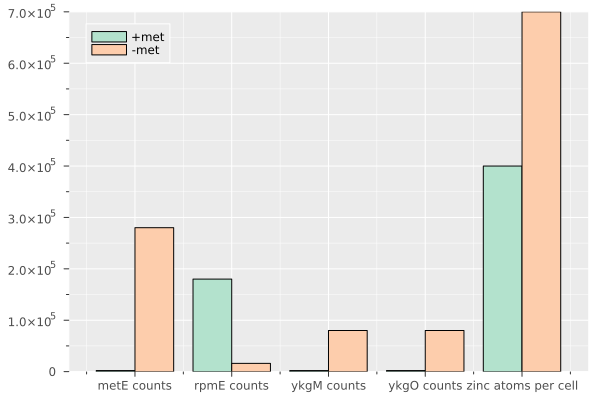

In [36]:
groupedbar(nam, data, group=ctg)

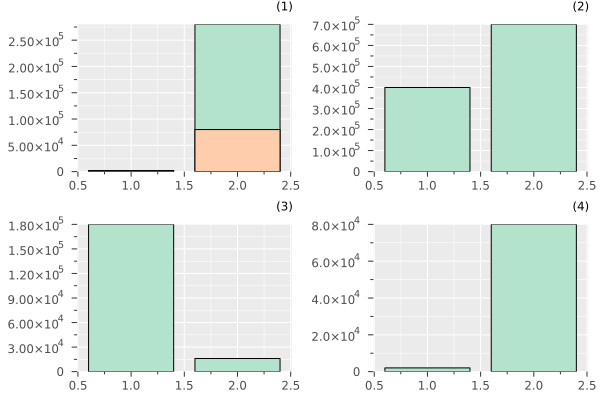

In [37]:
l = @layout [grid(2,2)]

plot(
    transpose(data),
    layout = l, legend = false, seriestype = [:bar],
    title = ["($i)" for j in 1:1, i in 1:11], titleloc = :right, titlefont = font(8)
)

# Organic

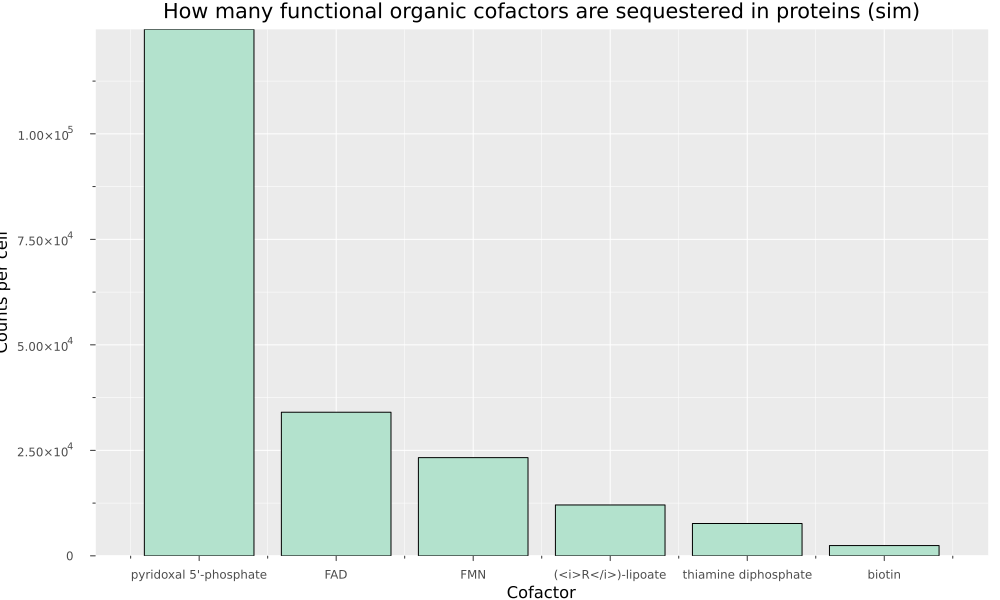

In [38]:
element_timeseries = total_counts * C * P

cur_elements = ["FAD", "FMN", "thiamine diphosphate", "pyridoxal 5'-phosphate", "biotin", "(<i>R</i>)-lipoate"]

element_idx = [element in cur_elements for element in cofactor_names]

sorted_idxs = sortperm(element_timeseries[1,element_idx], rev=true)

plot(bar(cofactor_names[element_idx][sorted_idxs], element_timeseries[1,element_idx][sorted_idxs]), legend = false, size=[1000,600],
    title="How many functional organic cofactors are sequestered in proteins (sim)", xlabel="Cofactor", ylabel="Counts per cell")

# savefig("figures/organic_counts.svg")

## Premium Amino Acids (tm)

In [39]:
aa_ids

22-element Vector{String}:
 "CYS"
 "PRO"
 "TYR"
 "VAL"
 "GLY"
 "ASN"
 "LYS"
 "HIS"
 "TRP"
 "PHE"
 "ARG"
 "ILE"
 "THR"
 "TER"
 "LEU"
 "ALA"
 "GLN"
 "GLU"
 "SER"
 "ASP"
 "MET"
 "SEL"

In [40]:
cur_elements = ["TRP"]
cap_entries = 50

# create counts matrices
C_P_counts = C .* repeat(counts, 1, length(monomer_names))
C_E_counts = C_P_counts * A #  * E


# we have to normalize the array because C is not norm-preserving. 
C_W = C * W * W2
C_W_norm = Array{Float64}(copy(C_W))

for i in 1:size(C_W_norm)[1]
    C_W_norm[i, :] = C_W[i, :] / (sum(C_W[i, :]) + 0.00001)
end

C_W_norm_counts_cats = C_W_norm

# creating element indices of interest
element_idxs = [element in cur_elements for element in aa_ids]
element_idxs_nz = findall(vec(element_idxs))

## cplx sorted by counts of elements
capped_complex_idx = sortperm(vec(sum(C_E_counts[:, element_idxs], dims=2)), rev=true)[1:cap_entries]
capped_classes = findall(vec(sum(C_W_norm_counts_cats[capped_complex_idx, :],dims=1) .!= 0))

capped_C_E = C_E_counts[capped_complex_idx, element_idxs]
capped_C_W = C_W_norm_counts_cats[capped_complex_idx, capped_classes]


# corrective factor multiplies a cplx by its cofactor stoichiometry
corrective_factor = sum((C * A)[capped_complex_idx, element_idxs], dims=2)

# create "remaining elements"
total_element_counts = vec(sum(C_E_counts[:, element_idxs], dims=1))
in_use_element_counts = vec(sum(capped_C_E, dims=1))
remaining_element_counts = vec(total_element_counts - in_use_element_counts)

# create "no class cplx", just use C_E counts
unclassified_cplx_idxs = vec(sum(capped_C_W, dims=2) .== 0)
unclassified_cplx_counts = vec(sum(capped_C_E, dims=2))

# create sizes
n_cplx = length(capped_complex_idx)
n_classes = length(capped_classes)
n_elements = length(cur_elements)

# initialize arrays
src = Vector{Int64}()
dst = Vector{Int64}()
weights = Vector{Int64}()

# create labels
node_labels = [aa_ids[element_idxs]; 
                unwrapped_protein_names[capped_complex_idx]; 
                unwrapped_pathway_names[capped_classes];
                ["Remaining $c proteins" for c ∈ aa_ids[element_idxs]];
                "Uncategorized"]

# create colors
colors = zeros(Int64, length(node_labels))

element_colors = collect(1:(n_elements))
other_color = 0

colors[1:n_elements] = element_colors

# create sorting
## sorts elements
ordering_elements = Vector{Pair{Int64, Int64}}()
sort_elements = sortperm(vec(sum(capped_C_E, dims=1)), rev=true)
for i in 1:(n_elements-1)
    push!(ordering_elements, sort_elements[i]=>sort_elements[i+1])
end

# sort_cplxs = sortperm(vec(sum(capped_C_E, dims=2)), rev=true)
# for i in 1:(n_cplx-1)
#     push!(ordering_elements, n_elements+sort_cplxs[i]=>n_elements+sort_cplxs[i+1]) 
# end

# order of index assignments
# elements, cplx, classes, remaining elements, no class label

# chart progress: E -> C -> W
# E -> C, reverse order because im a dumbass
for i in 1:n_elements
    for j in 1:n_cplx
        if capped_C_E[j, i] != 0
            
            push!(src, i)
            push!(dst, n_elements + j)
            push!(weights, capped_C_E[j, i])
            
            colors[n_elements + j] = colors[i]
            
        end  
    end
end

# # C -> W
for i in 1:n_cplx
    for j in 1:n_classes
        if capped_C_W[i, j] != 0
            
            # corrective factor multiplies by element multiplicity to maintain flow size
            
            push!(src, n_elements + i)
            push!(dst, n_elements + n_cplx + j)
            push!(weights, trunc(Int64, capped_C_W[i, j] * vec(sum(capped_C_E, dims=2))[i]))   
            
            colors[n_elements + n_cplx + j] = colors[n_elements + i]
            
        end  
    end
    
    if unclassified_cplx_idxs[i]
        push!(src, n_elements + i)
        push!(dst, n_elements + n_cplx + n_classes + n_elements + 1)
        push!(weights, unclassified_cplx_counts[i])
        
        colors[n_elements + n_cplx + n_classes + n_elements + 1] = colors[n_elements + i]
    end
    
end

# E -> C remaining cnts
for i in 1:n_elements
    push!(src, i)
    push!(dst, n_elements + n_cplx + n_classes + i)
    push!(weights, remaining_element_counts[i])
    colors[n_elements + n_cplx + n_classes + i] = colors[i]
end 

# # C -> P remaining cnts in displayed classes
# for i in 1:n_elements



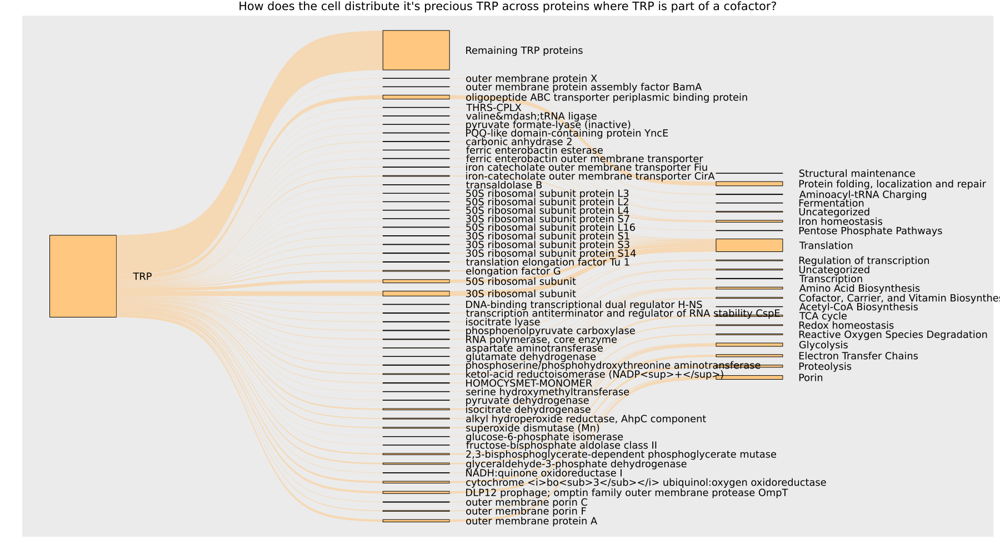

In [41]:
sankey(src, dst, weights, 
        compact = true,
        node_labels = node_labels,
        node_colors = cgrad(:copper, maximum(colors)+1, categorical = true, rev=true)[colors],
        edge_color = :src,
        size=(1800, 1000),
        label_position = :right,
        label_size = 12,
        force_order = ordering_elements,
        title="How does the cell distribute it's precious TRP across proteins where TRP is part of a cofactor?"
)

# savefig("figures/general_ressource_aa.svg")

# Proteome mass fraction cofactor pathways

In [42]:
W_comb = W * W2
W_norm = Array{Float64}(copy(W_comb))

for i in 1:size(W_norm)[1]
    W_norm[i, :] = W_norm[i, :] / (sum(W_norm[i, :]) + 0.00001)
end

In [43]:
top_protein_masses = transpose(Diagonal(monomer_masses)) * transpose(C) * vec(counts_min)
top_protein_masses = Array{Float64}(top_protein_masses)
top_protein_masses = top_protein_masses ./ (10^(10)) 
top_protein_masses = top_protein_masses ./ (6.023 * 10^(13)) 

top_L2_rank = sortperm(top_protein_masses, rev=true)
total_protein_mass = sum(top_protein_masses)

[monomer_names[top_L2_rank] top_protein_masses[top_L2_rank]][1:40, :]

40×2 Matrix{Any}:
 "HOMOCYSMET-MONOMER"                                           6.08977e-15
 "translation elongation factor\nTu 1"                          4.58126e-15
 "outer membrane protein A"                                     4.30041e-15
 "glyceraldehyde-3-phosphate\ndehydrogenase A"                  4.21251e-15
 "outer membrane porin F"                                       4.11633e-15
 "murein lipoprotein"                                           3.4308e-15
 "30S ribosomal subunit protein\nS1"                            3.15456e-15
 "DLP12 prophage; omptin family\nouter membrane protease OmpT"  2.94134e-15
 "isocitrate dehydrogenase"                                     2.72041e-15
 "50S ribosomal subunit protein\nL12"                           2.68308e-15
 "elongation factor G"                                          2.36134e-15
 "ketol-acid reductoisomerase\n(NADP<sup>+</sup>)"              2.29257e-15
 "alkyl hydroperoxide reductase,\nAhpC component"               2.25171

In [44]:
[monomer_names[top_L2_rank] top_protein_masses[top_L2_rank]/total_protein_mass][1:40, :]

40×2 Matrix{Any}:
 "HOMOCYSMET-MONOMER"                                           0.0260675
 "translation elongation factor\nTu 1"                          0.0196103
 "outer membrane protein A"                                     0.0184081
 "glyceraldehyde-3-phosphate\ndehydrogenase A"                  0.0180318
 "outer membrane porin F"                                       0.0176201
 "murein lipoprotein"                                           0.0146857
 "30S ribosomal subunit protein\nS1"                            0.0135032
 "DLP12 prophage; omptin family\nouter membrane protease OmpT"  0.0125905
 "isocitrate dehydrogenase"                                     0.0116448
 "50S ribosomal subunit protein\nL12"                           0.011485
 "elongation factor G"                                          0.0101078
 "ketol-acid reductoisomerase\n(NADP<sup>+</sup>)"              0.00981344
 "alkyl hydroperoxide reductase,\nAhpC component"               0.00963851
 ⋮                 

In [45]:
top_L2_classes_protein_masses = (transpose(W_norm) * transpose(Diagonal(monomer_masses)) * transpose(C) * vec(counts_min))
top_L2_classes_protein_masses = Array{Float64}(top_L2_classes_protein_masses)
top_L2_classes_protein_masses = top_L2_classes_protein_masses ./ (10^(10)) 
top_L2_classes_protein_masses = top_L2_classes_protein_masses ./ (6.023 * 10^(13)) 

top_L2_rank = sortperm(top_L2_classes_protein_masses, rev=true)

mass_relative = top_L2_classes_protein_masses ./ sum(top_L2_classes_protein_masses)
[pathway_names[top_L2_rank] mass_relative[top_L2_rank]][1:20, :]

20×2 Matrix{Any}:
 "Translation"                                   0.260538
 "Uncategorized"                                 0.126448
 "Amino Acid Biosynthesis"                       0.0760157
 "Glycolysis"                                    0.0516272
 "Cofactor, Carrier, and Vitamin\nBiosynthesis"  0.048382
 "Porin"                                         0.0474022
 "Regulation of transcription"                   0.0306598
 "Protein folding, localization\nand repair"     0.0277829
 "Nucleoside and Nucleotide\nBiosynthesis"       0.0267107
 "TCA cycle"                                     0.025323
 "Non-porin small-molecule\ntransport"           0.0227644
 "Proteolysis"                                   0.0207083
 "Aminoacyl-tRNA Charging"                       0.0200697
 "Transcription"                                 0.0197652
 "Iron homeostasis"                              0.0188932
 "Structural maintenance"                        0.0184837
 "Fatty Acid and Lipid\nBiosynthesis"     

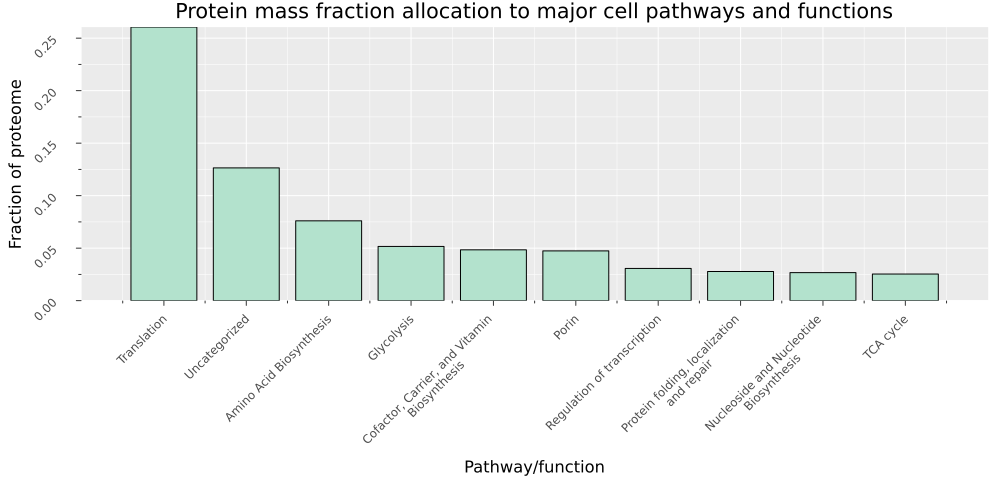

In [46]:
plot(bar(pathway_names[top_L2_rank][1:10], mass_relative[top_L2_rank][1:10]), 
    legend = false, size=[1000,500],
    rotation=45, 
    title="Protein mass fraction allocation to major cell pathways and functions", 
    xlabel="Pathway/function", ylabel="Fraction of proteome",
    bottom_margin=25Plots.mm, left_margin=5Plots.mm)


# savefig("figures/protein_mass_dist_class.svg")

# Compare with Fe

In [47]:
cur_elements = ["FE"]

element_idxs = [element in cur_elements for element in element_names]

C_E = C * P * E
c_e = vec(C_E[:, element_idxs])
nz_e_idxs = findall(c_e .> 0)

[c_e[nz_e_idxs] protein_names[nz_e_idxs]]

c_e_counts = counts[nz_e_idxs] .* c_e[nz_e_idxs] 

# other counts already took care of complex size, magnitude, etc. 
C_W = C * W * W2
C_W_normed = C_W ./ (sum(C_W, dims=2) .+ 0.0000001)

E_W_capped = C_W_normed[nz_e_idxs, :] .* c_e_counts

e_w = vec(sum(E_W_capped, dims=1))
e_w_relative = e_w ./ sum(e_w)

top_e_w_rank = sortperm(e_w, rev=true)

[pathway_names[top_e_w_rank] e_w[top_e_w_rank]][1:40, :]

40×2 Matrix{Any}:
 "Electron Transfer Chains"                                          …      1.16422e5
 "Cofactor, Carrier, and Vitamin\nBiosynthesis"                         78036.1
 "Amino Acid Biosynthesis"                                              38109.7
 "Uncategorized"                                                        37965.0
 "TCA cycle"                                                            34794.0
 "Regulation of transcription"                                       …  33478.0
 "Iron homeostasis"                                                     31425.0
 "tRNA modification"                                                    18820.0
 "Redox homeostasis"                                                    18712.0
 "Secondary Metabolite\nBiosynthesis"                                   11672.0
 "Fermentation"                                                      …   9809.0
 "Nucleoside and Nucleotide\nBiosynthesis"                               7926.0
 "Protein foldin

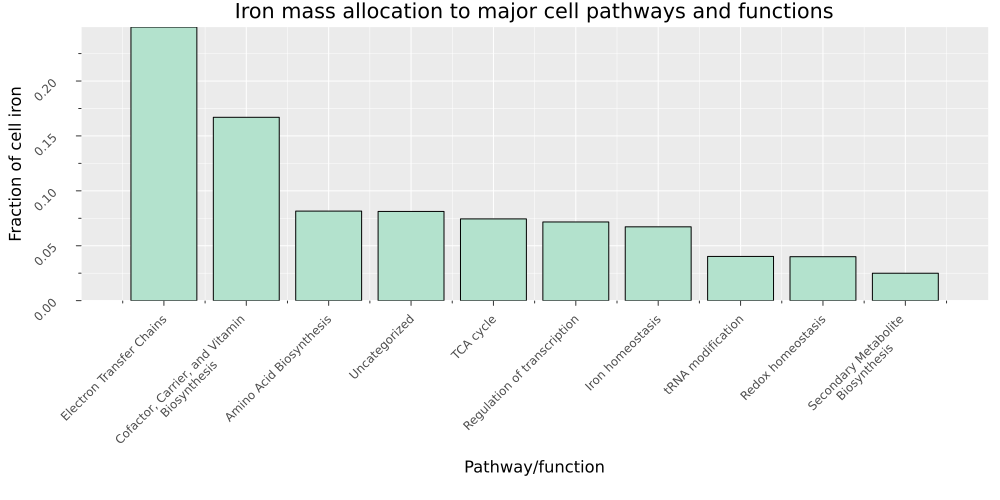

In [48]:
plot(bar(pathway_names[top_e_w_rank][1:10], e_w_relative[top_e_w_rank][1:10]), 
    legend = false, size=[1000,500],
    rotation=45, 
    title="Iron mass allocation to major cell pathways and functions", 
    xlabel="Pathway/function", ylabel="Fraction of cell iron",
    bottom_margin=25Plots.mm, left_margin=5Plots.mm)

# savefig("figures/iron_mass_dist_class.svg")

In [49]:
cur_elements = ["ZN"]

element_idxs = [element in cur_elements for element in element_names]

C_E = C * P * E
c_e = vec(C_E[:, element_idxs])
nz_e_idxs = findall(c_e .> 0)


c_e_counts = counts[nz_e_idxs] .* c_e[nz_e_idxs] 

# other counts already took care of complex size, magnitude, etc. 
C_W = C * W * W2
C_W_normed = C_W ./ (sum(C_W, dims=2) .+ 0.0000001)

E_W_capped = C_W_normed[nz_e_idxs, :] .* c_e_counts

e_w = vec(sum(E_W_capped, dims=1))
e_w_relative = e_w ./ sum(e_w)

top_e_w_rank = sortperm(e_w, rev=true)

[pathway_names[top_e_w_rank] e_w[top_e_w_rank]][1:40, :]

40×2 Matrix{Any}:
 "Translation"                                        74791.0
 "Glycolysis"                                         41349.5
 "Uncategorized"                                      32383.0
 "Aminoacyl-tRNA Charging"                            26312.0
 "Transcription"                                      23486.0
 "Nucleoside and Nucleotide\nBiosynthesis"            22670.0
 "Cofactor, Carrier, and Vitamin\nBiosynthesis"       20721.3
 "Regulation of transcription"                        20124.5
 "Alcohol Degradation"                                15022.0
 "Polymeric Compound Degradation"                     12485.0
 "Amino Acid Biosynthesis"                            11476.7
 "Proteolysis"                                         9500.49
 "Fatty Acid and Lipid\nBiosynthesis"                  5877.0
 ⋮                                                    
 "Ribosome biogenesis"                                  686.0
 "Fermentation"                                         61

In [50]:
plot(bar(pathway_names[top_e_w_rank][1:10], e_w_relative[top_e_w_rank][1:10]), 
    legend = false, size=[1000,500],
    rotation=45, 
    title="Zinc mass allocation to major cell pathways and functions", 
    xlabel="Pathway/function", ylabel="Fraction of cell zinc",
    bottom_margin=25Plots.mm, left_margin=5Plots.mm)

savefig("figures/zinc_mass_dist_class.svg")

"/Users/cyrus/vivarium-ecoli/notebooks/cofactors/figures/zinc_mass_dist_class.svg"

In [ ]:
minor_elements = ["CU", "MN"]
plot_array = []

for element in minor_elements
    cur_elements = [element]
    
    element_idxs = [element in cur_elements for element in element_names]
    
    C_E = C * P * E
    c_e = vec(C_E[:, element_idxs])
    nz_e_idxs = findall(c_e .> 0)
    
    
    c_e_counts = counts[nz_e_idxs] .* c_e[nz_e_idxs] 
    
    # other counts already took care of complex size, magnitude, etc. 
    C_W = C * W * W2
    C_W_normed = C_W ./ (sum(C_W, dims=2) .+ 0.0000001)
    
    E_W_capped = C_W_normed[nz_e_idxs, :] .* c_e_counts
    
    e_w = vec(sum(E_W_capped, dims=1))
    e_w_relative = e_w ./ sum(e_w)
    
    top_e_w_rank = sortperm(e_w, rev=true)
    
    [pathway_names[top_e_w_rank] e_w[top_e_w_rank]][1:40, :]
    
    
    p = plot(bar(pathway_names[top_e_w_rank][1:4], e_w_relative[top_e_w_rank][1:4]), 
        legend = false, size=[800,400],
        rotation=45, 
        title="$element allocation in cell", 
        xlabel="Pathway/function", ylabel="Fraction of cell $element",
        bottom_margin=30Plots.mm, left_margin=5Plots.mm)

    push!(plot_array, p)

end

plot(plot_array..., layout=(1, 2))

# savefig("figures/cu_mn_dist_class.svg")

# metal ion per mass ratio

In [ ]:
cur_elements = ["FE", "ZN", "MN", "CA", "NI", "CU", "MO", "SE", "CO"]

element_idxs = [element in cur_elements for element in element_names]

# first, get mass per top 20 class
# normalized class belonging
W_comb = W * W2
W_norm = Array{Float64}(copy(W_comb))

for i in 1:size(W_norm)[1]
    W_norm[i, :] = W_norm[i, :] / (sum(W_norm[i, :]) + 0.00001)
end

# first, for cplxes without cofactor 
mass_per_class = (transpose(W_norm) * transpose(Diagonal(monomer_masses)) * transpose(C) * vec(counts))
mass_per_class = Array{Float64}(mass_per_class)
mass_per_class = mass_per_class ./ (10^(10)) 
mass_per_class = mass_per_class ./ (6.023 * 10^(13)) 

top_mass_class = sortperm(mass_per_class, rev=true)
top_mass_filter = top_mass_class[1:15]

# now, get counts of transition metal ions per class
c_e_summed = vec(sum((C * P * E)[:, element_idxs], dims=2))
nz_e_idxs = findall(c_e_summed .> 0)

c_e_counts = counts[nz_e_idxs] .* c_e_summed[nz_e_idxs] 

# other counts already took care of complex size, magnitude, etc. 
C_W = C * W * W2
C_W_normed = C_W ./ (sum(C_W, dims=2) .+ 0.0000001)

E_W_capped = C_W_normed[nz_e_idxs, :] .* c_e_counts

e_w = vec(sum(E_W_capped, dims=1))

top_e_w_rank = sortperm(e_w, rev=true)

metal_atoms_per_protein_mass = e_w ./ (mass_per_class .* 10^15)
remove_nan = findall(isnan.(metal_atoms_per_protein_mass)) 
top_ratios = sortperm(metal_atoms_per_protein_mass, rev=true) 

filtered_top_ratios = [item for item in top_ratios if item ∉ remove_nan]
filtered_top_ratios = [item for item in filtered_top_ratios if item ∈ top_mass_filter]

[pathway_names[filtered_top_ratios] metal_atoms_per_protein_mass[filtered_top_ratios]][1:10, :]

In [ ]:
plot(bar(pathway_names[filtered_top_ratios][1:15], metal_atoms_per_protein_mass[filtered_top_ratios][1:15]), 
    legend = false, size=[1000,500],
    rotation=45, 
    title="Transition metal atoms per fg of protein, per sector", 
    xlabel="Pathway/function", ylabel="Transition metal atoms / fg protein",
    bottom_margin=25Plots.mm, left_margin=5Plots.mm)

# savefig("figures/atoms_per_fg_per_sector.svg")

In [ ]:
plot(bar(pathway_names[filtered_top_ratios][1:15], (mass_per_class .* 10^15)[filtered_top_ratios][1:15]), 
    legend = false, size=[1000,500],
    rotation=45, 
    title="fg of protein per sector", 
    xlabel="Pathway/function", ylabel="fg protein",
    bottom_margin=25Plots.mm, left_margin=5Plots.mm)

# savefig("figures/protein_per_sector.svg")

In [ ]:
plot(bar(pathway_names[filtered_top_ratios][1:15], e_w[filtered_top_ratios][1:15]), 
    legend = false, size=[1000,500],
    rotation=45, 
    title="Transition metal atoms per sector", 
    xlabel="Pathway/function", ylabel="fg protein",
    bottom_margin=25Plots.mm, left_margin=5Plots.mm)

# savefig("figcolorsures/atoms_per_sector.svg")

# Areas and distribution across sectors

In [ ]:
total_areas = (counts_min .* protein_areas) / sum( (counts_min .* protein_areas) )
area_order = sortperm(total_areas, rev=true)

[protein_names[area_order[1:20]] total_areas[area_order[1:20]] counts_min[area_order[1:20]] protein_areas[area_order[1:20]]] 

In [ ]:

# first, get mass per top 20 class
# normalized class belonging
W_comb = W * W2
W_norm = Array{Float64}(copy(W_comb))

for i in 1:size(W_norm)[1]
    W_norm[i, :] = W_norm[i, :] / (sum(W_norm[i, :]) + 0.00001)
end

# first, for cplxes without cofactor 
mass_per_class = (transpose(W_norm) * transpose(Diagonal(monomer_masses)) * transpose(C) * vec(counts))
mass_per_class = Array{Float64}(mass_per_class)
mass_per_class = mass_per_class ./ (10^(10)) 
mass_per_class = mass_per_class ./ (6.023 * 10^(13)) 

top_mass_class = sortperm(mass_per_class, rev=true)
top_mass_filter = top_mass_class[1:15]

# now, get counts of transition metal ions per class
c_e_summed = vec(sum((C * P * E)[:, element_idxs], dims=2))
nz_e_idxs = findall(c_e_summed .> 0)

c_e_counts = counts[nz_e_idxs] .* c_e_summed[nz_e_idxs] 

# other counts already took care of complex size, magnitude, etc. 
C_W = C * W * W2
C_W_normed = C_W ./ (sum(C_W, dims=2) .+ 0.0000001)

E_W_capped = C_W_normed[nz_e_idxs, :] .* c_e_counts

e_w = vec(sum(E_W_capped, dims=1))

top_e_w_rank = sortperm(e_w, rev=true)

metal_atoms_per_protein_mass = e_w ./ (mass_per_class .* 10^15)
remove_nan = findall(isnan.(metal_atoms_per_protein_mass)) 
top_ratios = sortperm(metal_atoms_per_protein_mass, rev=true) 

filtered_top_ratios = [item for item in top_ratios if item ∉ remove_nan]
filtered_top_ratios = [item for item in filtered_top_ratios if item ∈ top_mass_filter]

[pathway_names[filtered_top_ratios] metal_atoms_per_protein_mass[filtered_top_ratios]][1:10, :]

# Fraction of active protein complexes with at least one cofactor 

In [ ]:
cur_elements = ["FE", "ZN", "MN", "CA", "NI", "CU", "MO", "SE", "CO"]

element_idxs = [element in cur_elements for element in element_names]

# first, get indices of cplxes with trace elements
C_bin = C .> 0
P_bin = P .> 0
E_bin = E .> 0

CE_bin = C_bin * P_bin * E_bin

bin_cplx = vec(sum(CE_bin[1:length(complex_names), element_idxs], dims=2) .> 0)

# then, get fraction of mass per cplx
all_masses = transpose(Diagonal(monomer_masses)) * transpose(C) * vec(counts)
all_masses = Array{Float64}(all_masses)
all_masses = all_masses ./ (10^(10)) 
all_masses = all_masses ./ (6.023 * 10^(13)) 

# filter to cplx
sum(all_masses[1:length(complex_names)])
sum(all_masses[1:length(complex_names)][bin_cplx]) / sum(all_masses[1:length(complex_names)])

## distributed across classes

In [ ]:
# normalized class belonging
W_comb = W * W2
W_norm = Array{Float64}(copy(W_comb))

for i in 1:size(W_norm)[1]
    W_norm[i, :] = W_norm[i, :] / (sum(W_norm[i, :]) + 0.00001)
end

# first, for cplxes without cofactor 
C_cut = C[1:length(complex_names), :]
counts_cut = counts[1:length(complex_names)]
counts_cut_pos = counts_cut .* bin_cplx

mass_per_class = (transpose(W_norm) * transpose(Diagonal(monomer_masses)) * transpose(C_cut) * vec(counts_cut))
mass_per_class = Array{Float64}(mass_per_class)
mass_per_class = mass_per_class ./ (10^(10)) 
mass_per_class = mass_per_class ./ (6.023 * 10^(13)) 

pos_mass_per_class = (transpose(W_norm) * transpose(Diagonal(monomer_masses)) * transpose(C_cut) * vec(counts_cut_pos))
pos_mass_per_class = Array{Float64}(pos_mass_per_class)
pos_mass_per_class = pos_mass_per_class ./ (10^(10)) 
pos_mass_per_class = pos_mass_per_class ./ (6.023 * 10^(13)) 

top_mass_class = sortperm(mass_per_class, rev=true)

pos_ratio = pos_mass_per_class ./ mass_per_class

mass_relative = mass_per_class ./ sum(mass_per_class)
[pathway_names[top_mass_class] mass_per_class[top_mass_class] pos_mass_per_class[top_mass_class] pos_ratio[top_mass_class]][1:15, :]

In [ ]:
length(complex_names)

## misc

In [ ]:
findfirst(isequal("REACTIVE-OXYGEN-SPECIES-DEGRADATION"), pathway_names)

In [ ]:
findfirst(isequal("DETOX1-PWY"), pathway_names)

In [ ]:
findfirst(isequal("CARBPSYN-CPLX"), protein_names)

In [ ]:
C

In [ ]:
protein_names

In [ ]:
counts

## for khoa

In [ ]:
CSV.write("data/complex_to_class_matrix.csv",  Tables.table(C_W_normed), writeheader=true, header=unwrapped_pathway_names)